# Analyzing Eye Tracker Data

Before we have our first look at some eye tracking data, let's import some useful Python libraries

In [72]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation
from IPython.display import HTML
import seaborn as sns

## Dataset

This data comes from the Tobii Glasses 2, which is a mobile eye tracker that can be worn similarly to normal eye glasses. See Tobii website for more information, https://www.tobii.com/products/eye-trackers/wearables/tobii-pro-glasses-3 (latest model is Tobii glasses 3)

In the data, the participant was asked to play a solo game of Jenga, where the player has to extract blocks from a stack of wood blocks and place the extracted blocks on top of the stack, without causing the stack to fall. Below is shown a frame from the eye tracker, full video can be found here: TBD ADD LINK

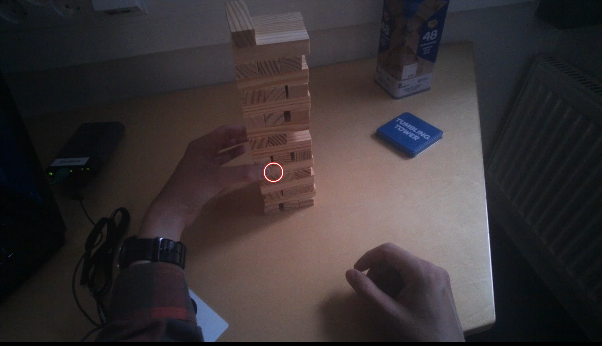
Frame captured from the eye tracker scene video. The eye tracker has one front-facing camera that records the user's point of view. The red/white circle shows the gaze location.

Now let's take a look at the data.

In [108]:
df = pd.read_csv('jenga-clip-data.csv')
pd.options.display.max_columns = None
display(df.head(n=6))
print(f'Size of dataframe {df.shape}')

,Recording timestamp,Computer timestamp,Sensor,Project name,Export date,Participant name,Recording name,Recording date,Recording date UTC,Recording start time,Recording start time UTC,Recording duration,Recording Fixation filter name,Event,Event value,Gaze point X,Gaze point Y,Gaze point 3D X,Gaze point 3D Y,Gaze point 3D Z,Gaze direction left X,Gaze direction left Y,Gaze direction left Z,Gaze direction right X,Gaze direction right Y,Gaze direction right Z,Pupil position left X,Pupil position left Y,Pupil position left Z,Pupil position right X,Pupil position right Y,Pupil position right Z,Pupil diameter left,Pupil diameter right,Validity left,Validity right,Recording media name,Recording media width,Recording media height,Eye movement type,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Gyro X,Gyro Y,Gyro Z,Accelerometer X,Accelerometer Y,Accelerometer Z
0,1100933,212005972,Accelerometer,Jenga-project,23.6.2022,T1,Recording001,1/1/2000,1/1/2000,2:19:16 AM,12:19:16 AM,58577,Tobii I-VT (Attention),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fullstream.mp4,1920,1080,Fixation,440,5,953.0,518.0,NaN,NaN,NaN,-10591.0,-93956.0,33621.0
1,1101814,212006853,Gyroscope,Jenga-project,23.6.2022,T1,Recording001,1/1/2000,1/1/2000,2:19:16 AM,12:19:16 AM,58577,Tobii I-VT (Attention),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fullstream.mp4,1920,1080,Fixation,440,5,953.0,518.0,207900.0,-13841.0,-94844.0,NaN,NaN,NaN
2,1109375,212014414,Eye Tracker,Jenga-project,23.6.2022,T1,Recording001,1/1/2000,1/1/2000,2:19:16 AM,12:19:16 AM,58577,Tobii I-VT (Attention),NaN,NaN,938.0,551.0,140557.0,-2544.0,3638614.0,-3412.0,8184.0,99606.0,11310.0,4213.0,99269.0,2963.0,-2629.0,-3652.0,-3303.0,-2394.0,-3312.0,589.0,542.0,Valid,Valid,fullstream.mp4,1920,1080,Fixation,440,5,953.0,518.0,NaN,NaN,NaN,NaN,NaN,NaN
3,1110754,212015793,Accelerometer,Jenga-project,23.6.2022,T1,Recording001,1/1/2000,1/1/2000,2:19:16 AM,12:19:16 AM,58577,Tobii I-VT (Attention),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fullstream.mp4,1920,1080,Fixation,440,5,953.0,518.0,NaN,NaN,NaN,-11376.0,-94729.0,33485.0
4,1112695,212017734,Gyroscope,Jenga-project,23.6.2022,T1,Recording001,1/1/2000,1/1/2000,2:19:16 AM,12:19:16 AM,58577,Tobii I-VT (Attention),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fullstream.mp4,1920,1080,Fixation,440,5,953.0,518.0,198100.0,-10759.0,-92168.0,NaN,NaN,NaN
5,1119370,212024409,Eye Tracker,Jenga-project,23.6.2022,T1,Recording001,1/1/2000,1/1/2000,2:19:16 AM,12:19:16 AM,58577,Tobii I-VT (Attention),NaN,NaN,938.0,548.0,141454.0,5366.0,3650480.0,-3486.0,7989.0,99619.0,11433.0,4725.0,99232.0,2928.0,-2639.0,-3655.0,-3294.0,-2368.0,-3307.0,595.0,539.0,Valid,Valid,fullstream.mp4,1920,1080,Fixation,440,5,953.0,518.0,NaN,NaN,NaN,NaN,NaN,NaN


Size of dataframe (5717, 50)


The data includes 50 columns and 5717 rows. Note that this is not the full recording, only a short snippet.

The columns have various types of information, the most important being

* **Recording timestamp**: time from the start of recording, typically measured in micro- or milliseconds.
* **Sensor**: Type of sensor the data comes from. This eye tracker also records Accelerometer and Gyroscope data in addition to the Eye tracker data
* **Recording Fixation filter name**: Type of Fixation filter used to detect fixations (you will learn about these during the course)
* **Gaze point X, Y**, etc... (including left and right eye results separately): Different types of gaze location data. Gaze point X and Y give us the gaze location on the video frame (shown in the first frame in this notebook). Note that most of the rows are NaN, because these data are from the Gyroscope and Accelerometer. The gaze coordinates are for the scene camera video.
* **Pupil diameter** (left and right eye): Diameter of the pupil. This information can be used to evaluate the user's cognitive workload (will be discussed in the course)
* **Recording media width/height**: Scene camera video dimensions in pixels.
* **Eye movement type**: Which type of eye movement is currently ongoing, e.g. fixation, saccade, etc. 
* **Gaze event duration**: How long the movement type lasted
* **Gyro/accelerometer** X, Y, Z: gyroscope and accelerometer data. This information can be used to analyse the head movements together with the gaze data

Let's have a look at the eye tracker data. First, we need to extract the eye tracker data from the gyroscope and accelerometer data.

In [13]:
df_et = df[df['Sensor'] == 'Eye Tracker'].reset_index(drop=True)
display(df_et.head())

,Recording timestamp,Computer timestamp,Sensor,Project name,Export date,Participant name,Recording name,Recording date,Recording date UTC,Recording start time,Recording start time UTC,Recording duration,Recording Fixation filter name,Event,Event value,Gaze point X,Gaze point Y,Gaze point 3D X,Gaze point 3D Y,Gaze point 3D Z,Gaze direction left X,Gaze direction left Y,Gaze direction left Z,Gaze direction right X,Gaze direction right Y,Gaze direction right Z,Pupil position left X,Pupil position left Y,Pupil position left Z,Pupil position right X,Pupil position right Y,Pupil position right Z,Pupil diameter left,Pupil diameter right,Validity left,Validity right,Recording media name,Recording media width,Recording media height,Eye movement type,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Gyro X,Gyro Y,Gyro Z,Accelerometer X,Accelerometer Y,Accelerometer Z
0,1109375,212014414,Eye Tracker,Jenga-project,23.6.2022,T1,Recording001,1/1/2000,1/1/2000,2:19:16 AM,12:19:16 AM,58577,Tobii I-VT (Attention),NaN,NaN,938.0,551.0,140557.0,-2544.0,3638614.0,-3412.0,8184.0,99606.0,11310.0,4213.0,99269.0,2963.0,-2629.0,-3652.0,-3303.0,-2394.0,-3312.0,589.0,542.0,Valid,Valid,fullstream.mp4,1920,1080,Fixation,440,5,953.0,518.0,NaN,NaN,NaN,NaN,NaN,NaN
1,1119370,212024409,Eye Tracker,Jenga-project,23.6.2022,T1,Recording001,1/1/2000,1/1/2000,2:19:16 AM,12:19:16 AM,58577,Tobii I-VT (Attention),NaN,NaN,938.0,548.0,141454.0,5366.0,3650480.0,-3486.0,7989.0,99619.0,11433.0,4725.0,99232.0,2928.0,-2639.0,-3655.0,-3294.0,-2368.0,-3307.0,595.0,539.0,Valid,Valid,fullstream.mp4,1920,1080,Fixation,440,5,953.0,518.0,NaN,NaN,NaN,NaN,NaN,NaN
2,1129363,212034402,Eye Tracker,Jenga-project,23.6.2022,T1,Recording001,1/1/2000,1/1/2000,2:19:16 AM,12:19:16 AM,58577,Tobii I-VT (Attention),NaN,NaN,938.0,545.0,143304.0,16482.0,3718715.0,-3309.0,8432.0,99589.0,11183.0,4648.0,99264.0,2964.0,-2629.0,-3653.0,-3304.0,-2394.0,-3313.0,590.0,543.0,Valid,Valid,fullstream.mp4,1920,1080,Fixation,440,5,953.0,518.0,NaN,NaN,NaN,NaN,NaN,NaN
3,1139349,212044388,Eye Tracker,Jenga-project,23.6.2022,T1,Recording001,1/1/2000,1/1/2000,2:19:16 AM,12:19:16 AM,58577,Tobii I-VT (Attention),NaN,NaN,939.0,547.0,140274.0,10038.0,3695508.0,-3502.0,7949.0,99622.0,11298.0,4824.0,99243.0,2929.0,-2638.0,-3656.0,-3294.0,-2358.0,-3321.0,593.0,542.0,Valid,Valid,fullstream.mp4,1920,1080,Fixation,440,5,953.0,518.0,NaN,NaN,NaN,NaN,NaN,NaN
4,1149345,212054384,Eye Tracker,Jenga-project,23.6.2022,T1,Recording001,1/1/2000,1/1/2000,2:19:16 AM,12:19:16 AM,58577,Tobii I-VT (Attention),NaN,NaN,939.0,551.0,137385.0,-3968.0,3612248.0,-3565.0,8105.0,99607.0,11353.0,4288.0,99261.0,2965.0,-2627.0,-3652.0,-3303.0,-2390.0,-3316.0,585.0,540.0,Valid,Valid,fullstream.mp4,1920,1080,Fixation,440,5,953.0,518.0,NaN,NaN,NaN,NaN,NaN,NaN


Now we have only the eye tracker data. Usually the first thing to do is to visualize it, e.g. with a scatter plot

[Text(0.5, 0, 'Gaze X coordinate'), Text(0, 0.5, 'Gaze Y coordinate')]

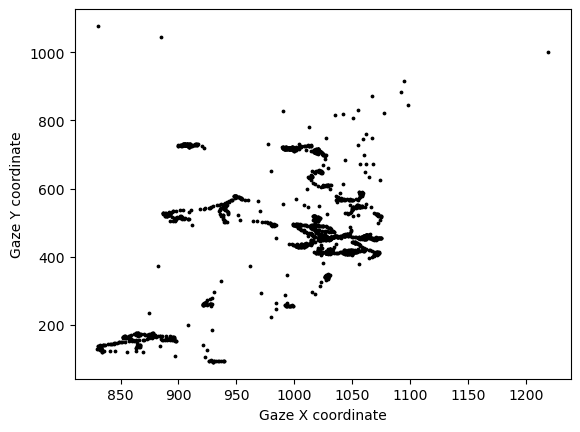

In [32]:
fig, ax = plt.subplots()
ax.scatter(df_et['Gaze point X'], df_et['Gaze point Y'], color='black', s=3)
ax.set(xlabel='Gaze X coordinate', ylabel='Gaze Y coordinate')

This plot shows the gaze X and Y coordinates, i.e. where the user is looking at (in the scene camera coordinates). It might be easier to see what is happening through animation (Press right arrow below the plot to start the animation):

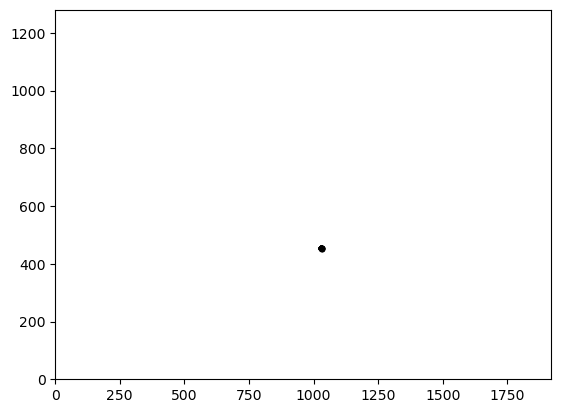

In [69]:
fig, ax = plt.subplots()
ax.axis([0,1920,0,1280])
m = ax.plot([],[], 'o', color='black', markersize=3)
draw_points_n = 30
def animate(i):
    draw_points_df = df_et.iloc[i-draw_points_n:i]
    m[0].set_data(draw_points_df['Gaze point X'], draw_points_df['Gaze point Y'])
    
gaze_animation = matplotlib.animation.FuncAnimation(fig, animate, frames=1000, interval=20)

HTML(gaze_animation.to_jshtml())

From the animation, you can probably see when the gaze is in fixation and when it is in saccade. Let's plot them with different marker colors, fixations in green and other events (mostly saccades) as red:

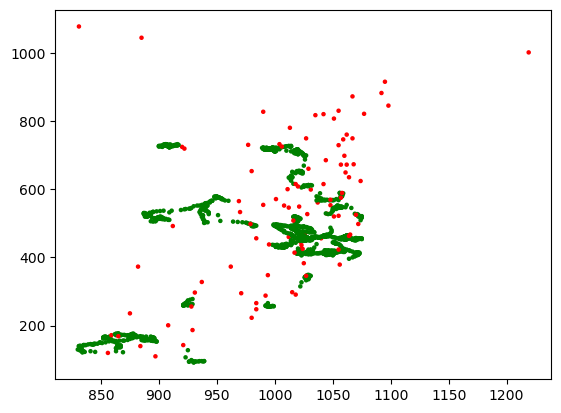

In [70]:
colors = ['green' if x == 'Fixation' else 'red' for x in df_et['Eye movement type']]
fig, ax = plt.subplots()
ax.scatter(df_et['Gaze point X'], df_et['Gaze point Y'], color=colors, s=5)

We can also check the durations of the events:

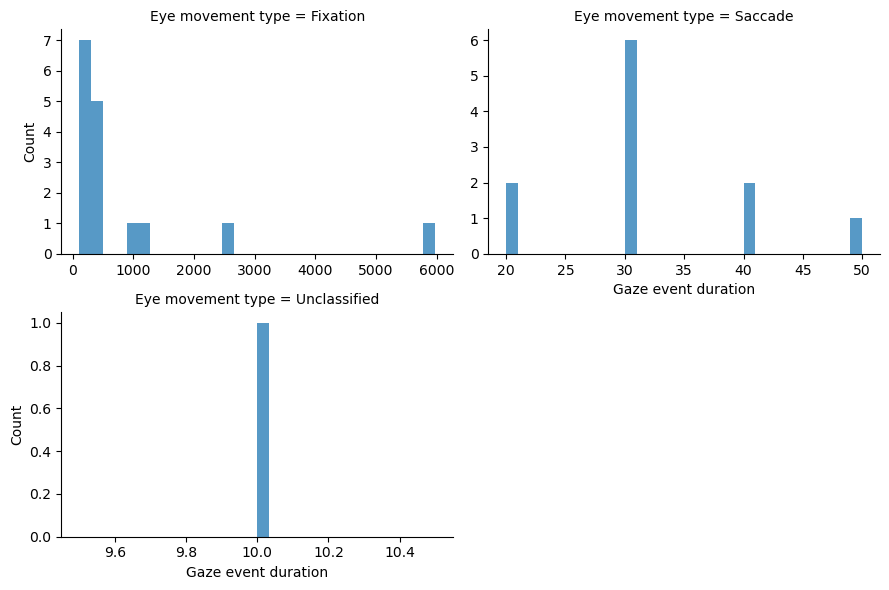

In [107]:
df_et_unique = df_et.drop_duplicates(subset='Eye movement type index') #Keep only one event duration data from each eye event
g = sns.displot(x='Gaze event duration',
            data=df_et_unique,
            col='Eye movement type',
            bins=30,
            col_wrap=2,
            facet_kws=dict(sharex=False, sharey=False),
            height=3,
            aspect=1.5,
            common_bins=False)

**Note the difference in durations between saccades and fixations**